In [2]:
import os
import pandas as pd
from matplotlib import pyplot as plt
from plotly import express as px


import kagglehub

## Download data sets

NOTE: You will need to register with Kaggle and create a kaggle.jcon file that contains your username and key in the following format: `{"username":"<user_name>", "key":"<kaggle_key>"}`

In [3]:
datasets = []

# #spotify tracks
datasets.append(kagglehub.dataset_download("maharshipandya/-spotify-tracks-dataset"))

for dataset in datasets:
    print(dataset)

C:\Users\bpburch\.cache\kagglehub\datasets\maharshipandya\-spotify-tracks-dataset\versions\1


In [4]:
# Initialize an empty dictionary to store the datasets
datasets_dict = {}

for dataset_path in datasets:
    # Extract the dataset name from the path
    dataset_name = os.path.basename(os.path.dirname(os.path.dirname(dataset_path)))
    
    # List all files in the dataset directory
    csv_files = [file for file in os.listdir(dataset_path) if file.endswith('.csv')]
    
    # Load the CSV files into dataframes
    if len(csv_files) == 1:
        # If there's only one CSV, load it as a single dataframe
        datasets_dict[dataset_name] = pd.read_csv(os.path.join(dataset_path, csv_files[0]))
    else:
        # If there are multiple CSVs, load them into a list of dataframes
        datasets_dict[dataset_name] = [pd.read_csv(os.path.join(dataset_path, csv)) for csv in csv_files]

# Print the keys of the dictionary to verify
print(datasets_dict.keys())

dict_keys(['-spotify-tracks-dataset'])


### Spotify Data

In [5]:
data = datasets_dict['-spotify-tracks-dataset'].copy()

In [6]:
data.columns

Index(['Unnamed: 0', 'track_id', 'artists', 'album_name', 'track_name',
       'popularity', 'duration_ms', 'explicit', 'danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
       'track_genre'],
      dtype='object')

In [7]:
data['duration_sec'] = data['duration_ms'] / 1000
data['duration_min'] = data['duration_sec'] / 60

<Axes: title={'center': 'Popular Songs are Short'}, xlabel='duration_min', ylabel='popularity'>

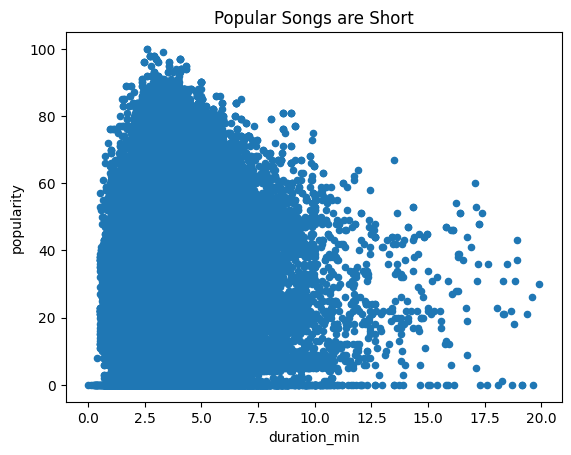

In [8]:
data[data.duration_min<20].plot(kind='scatter', x='duration_min', y='popularity', title = 'Popular Songs are Short')

In [9]:
# Create interactive scatter plot
fig = px.scatter(data[data.duration_min<20], 
                x='duration_min', 
                y='popularity',
                hover_data=['artists', 'album_name', 'track_name'],
                title='Popularity by song duration')

fig.update_layout(
    xaxis_title="Duration (minutes)",
    yaxis_title="Popularity Score"
)

fig.show()

In [10]:
data['popularity_group'] = pd.cut(data['popularity'], bins=[0, 20, 40, 60, 80, 100], labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])

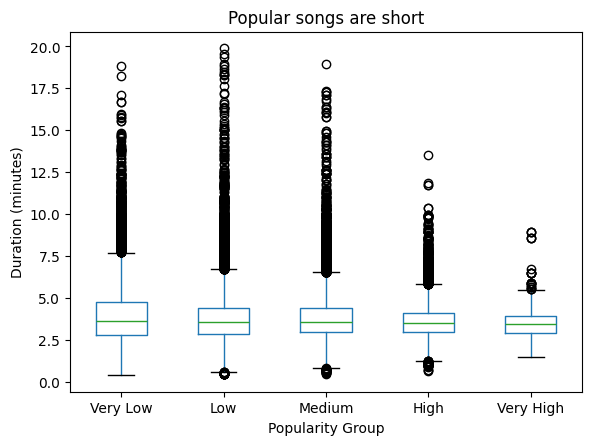

In [11]:
data[data.duration_min < 20].boxplot(column='duration_min', by='popularity_group', grid=False)
plt.title('Popular songs are short')
plt.suptitle('')  # Remove the automatic subtitle
plt.xlabel('Popularity Group')
plt.ylabel('Duration (minutes)')
plt.show()

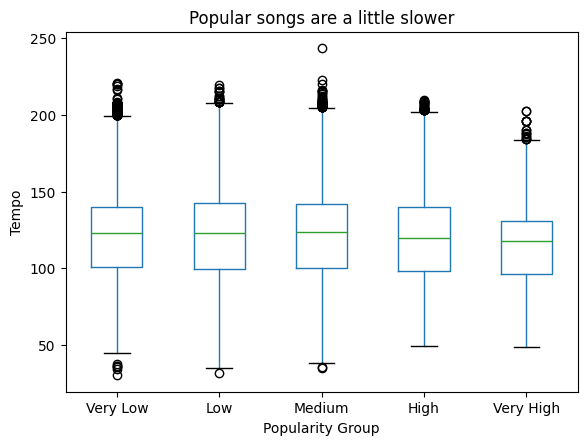

In [12]:
data[data.tempo >0].boxplot(column='tempo', by='popularity_group', grid=False)
plt.title('Popular songs are a little slower')
plt.suptitle('')  # Remove the automatic subtitle
plt.xlabel('Popularity Group')
plt.ylabel('Tempo')
plt.show()

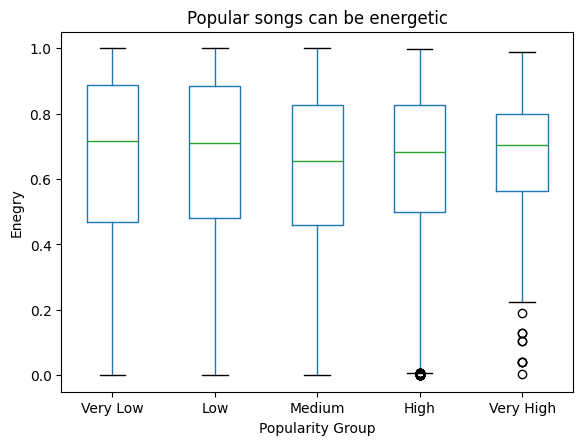

In [13]:
data.boxplot(column='energy', by='popularity_group', grid=False)
plt.title('Popular songs can be energetic')
plt.suptitle('')  # Remove the automatic subtitle
plt.xlabel('Popularity Group')
plt.ylabel('Enegry')
plt.show()

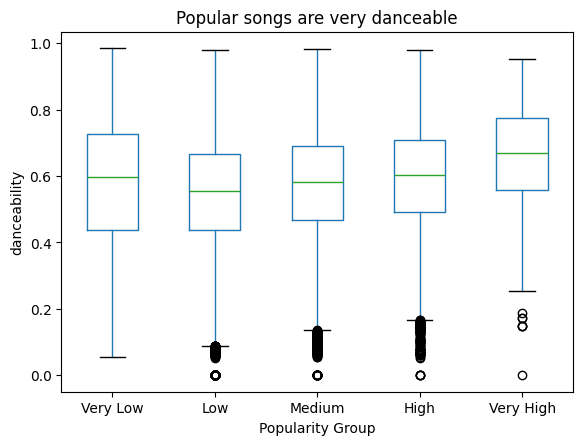

In [14]:
data.boxplot(column='danceability', by='popularity_group', grid=False)
plt.title('Popular songs are very danceable')
plt.suptitle('')  # Remove the automatic subtitle
plt.xlabel('Popularity Group')
plt.ylabel('danceability')
plt.show()

In [35]:
fig = px.scatter_3d(
    data[data.popularity > 80],
    x='tempo',
    y='energy',
    z='danceability',
    size='duration_min',
    color='popularity',
    hover_data=['artists', 'track_name', 'album_name'],
    title='3D Scatter Plot: Tempo, Energy, Danceability'
)

fig.update_layout(
    scene=dict(
        xaxis_title='Tempo',
        yaxis_title='Energy',
        zaxis_title='Danceability'
    ),
    width=1000,  # Set the width of the figure
    height=700   # Set the height of the figure
)

fig.show()

In [16]:
data.head()

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre,duration_sec,duration_min,popularity_group
0,0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,...,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic,230.666,3.844433,High
1,1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,...,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic,149.610,2.493500,Medium
2,2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,...,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic,210.826,3.513767,Medium
3,3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,...,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic,201.933,3.365550,High
4,4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,...,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic,198.853,3.314217,Very High


### What should Katy Perry do?

In [17]:
data['faceoff'] = data['artists'].fillna('').apply(lambda x: 'Katy Perry' if 'Katy Perry' in x else 'Taylor Swift' if 'Taylor Swift' in x else 'Other')

In [18]:
data.groupby('faceoff')['popularity'].mean()

faceoff
Katy Perry      22.341772
Other           33.242278
Taylor Swift    56.105263
Name: popularity, dtype: float64

In [19]:
# Map 'faceoff' values to marker symbols
symbol_map = {'Katy Perry': 'circle', 'Taylor Swift': 'square', 'Other': 'diamond'}
data['symbol'] = data['faceoff'].map(symbol_map)

# Create the 3D scatter plot
fig = px.scatter_3d(
    data[data.faceoff != 'Other'],
    x='tempo',
    y='energy',
    z='danceability',
    color='popularity',
    symbol='symbol',  # Use the 'symbol' column for marker shapes
    hover_data=['artists', 'track_name', 'album_name'],
    title='3D Scatter Plot: Tempo, Energy, Danceability',
    color_continuous_scale='viridis',  # Change color scale to viridis
    labels={'symbol': 'Artist'}  # Update legend label
)

# Update the legend to show artist names
fig.for_each_trace(lambda trace: trace.update(name=trace.name.replace('circle', 'Katy Perry').replace('square', 'Taylor Swift')))

fig.update_layout(
    scene=dict(
        xaxis_title='Tempo',
        yaxis_title='Energy',
        zaxis_title='Danceability'
    ),
    width=1200,  # Set the width of the figure
    height=800,  # Set the height of the figure
    legend=dict(
        x=0.85,  # Move the legend to the right
        y=0.5,
        title="artist",
        orientation="v"  # Vertical orientation for better spacing
    )
)

fig.show()

<Axes: title={'center': 'Katy Perry dancebility vs tempo'}, xlabel='tempo', ylabel='danceability'>

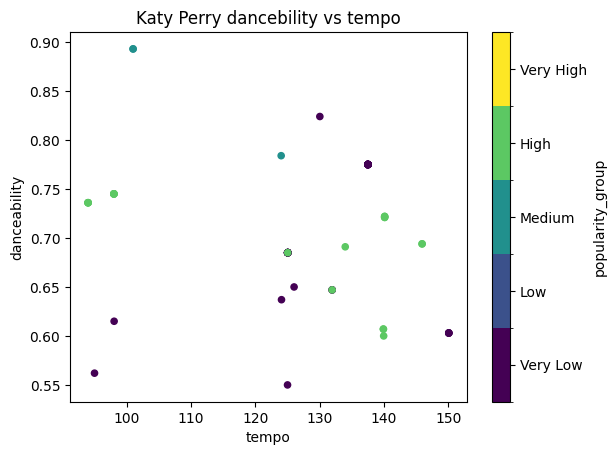

In [20]:
data[data.faceoff == 'Katy Perry'].plot(
    kind='scatter', 
    x='tempo', 
    y='danceability', 
    c='popularity_group', 
    colormap='viridis', 
    title='Katy Perry dancebility vs tempo'
)

<Axes: title={'center': 'Katy Perry energy vs tempo'}, xlabel='tempo', ylabel='energy'>

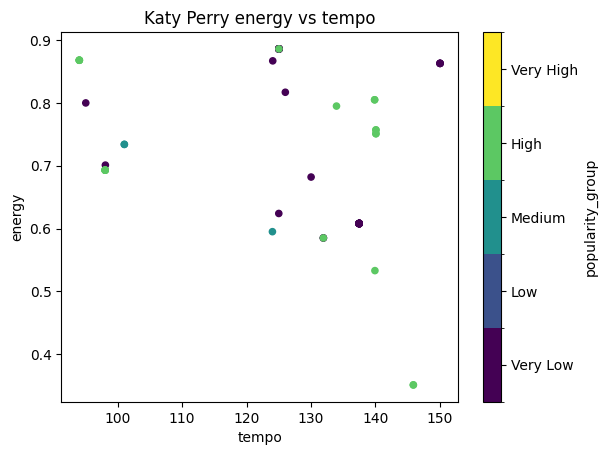

In [21]:
data[data.faceoff == 'Katy Perry'].plot(
    kind='scatter', 
    x='tempo', 
    y='energy', 
    c='popularity_group', 
    colormap='viridis', 
    title='Katy Perry energy vs tempo'
)

<Axes: title={'center': 'Katy Perry energy vs danceability'}, xlabel='danceability', ylabel='energy'>

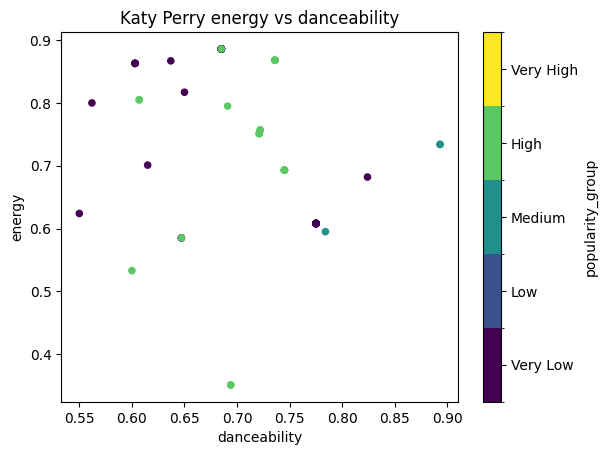

In [22]:
data[data.faceoff == 'Katy Perry'].plot(
    kind='scatter', 
    x='danceability', 
    y='energy', 
    c='popularity_group', 
    colormap='viridis', 
    title='Katy Perry energy vs danceability'
)

<Axes: title={'center': 'Katy Perry energy vs popularity'}, xlabel='energy', ylabel='popularity'>

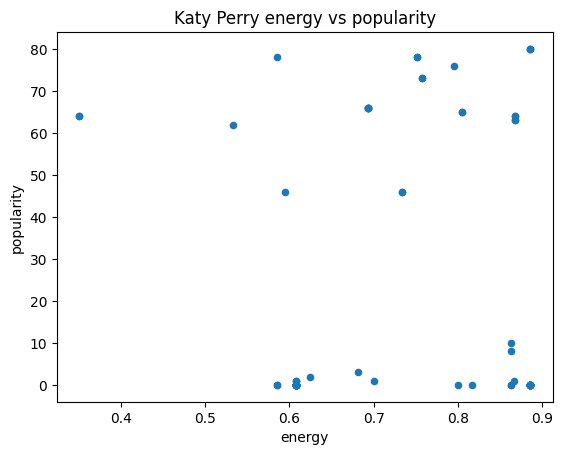

In [23]:
data[data.faceoff == 'Katy Perry'].plot(
    kind='scatter', 
    x='energy', 
    y='popularity', 

    title='Katy Perry energy vs popularity'
)

### Katy's Sweet Spot

In [24]:
katy_data = data[(data.faceoff == 'Katy Perry') &
    (data.tempo > 130) & (data.tempo < 150) &
    (data.danceability > 0.6) & (data.danceability < 0.75) 
    ]

<Axes: title={'center': 'Taylor Swift dancebility vs tempo'}, xlabel='tempo', ylabel='danceability'>

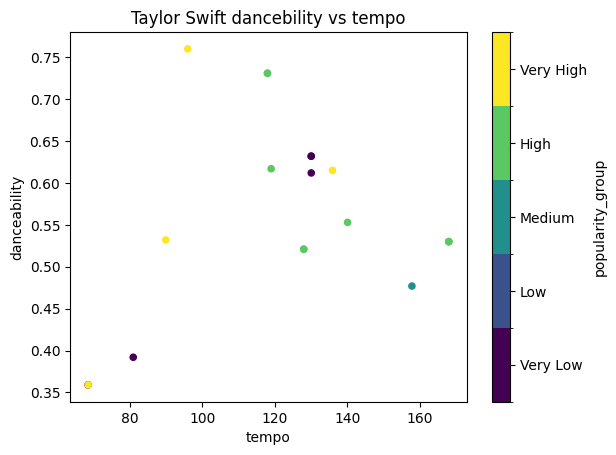

In [25]:
data[data.faceoff == 'Taylor Swift'].plot(
    kind='scatter', 
    x='tempo', 
    y='danceability', 
    c='popularity_group', 
    colormap='viridis', 
    title='Taylor Swift dancebility vs tempo'
)

<Axes: title={'center': 'Taylor Swift energy vs tempo'}, xlabel='tempo', ylabel='energy'>

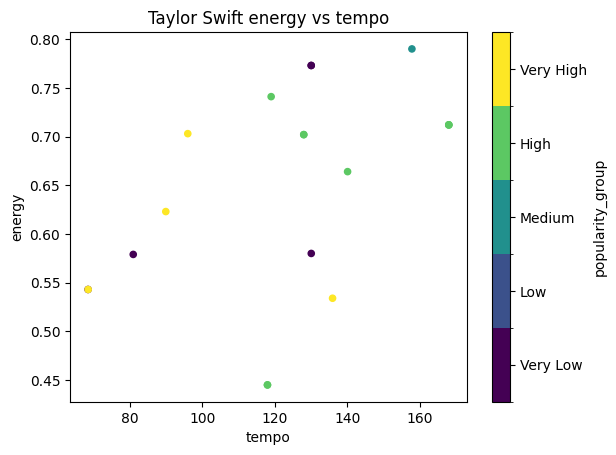

In [26]:
data[data.faceoff == 'Taylor Swift'].plot(
    kind='scatter', 
    x='tempo', 
    y='energy', 
    c='popularity_group', 
    colormap='viridis', 
    title='Taylor Swift energy vs tempo'
)

<Axes: title={'center': 'Taylor Swift energy vs danceability'}, xlabel='danceability', ylabel='energy'>

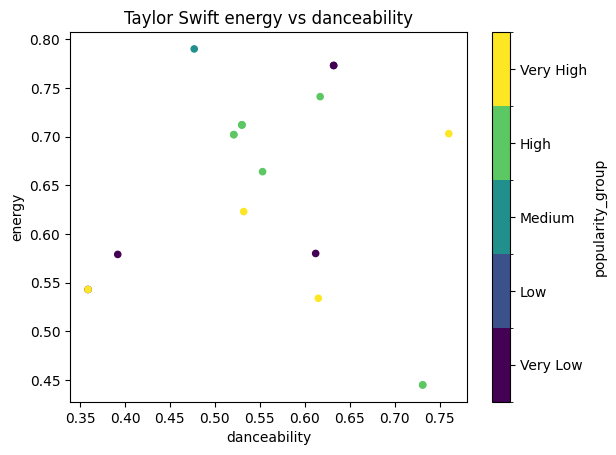

In [27]:
data[data.faceoff == 'Taylor Swift'].plot(
    kind='scatter', 
    x='danceability', 
    y='energy', 
    c='popularity_group', 
    colormap='viridis', 
    title='Taylor Swift energy vs danceability'
)

### Taylor's Sweet Spot

In [28]:
taylor_data = data[(data.faceoff == 'Taylor Swift') &
    (data.energy > 0.50) & (data.energy < 0.72) 
    ]

### Together

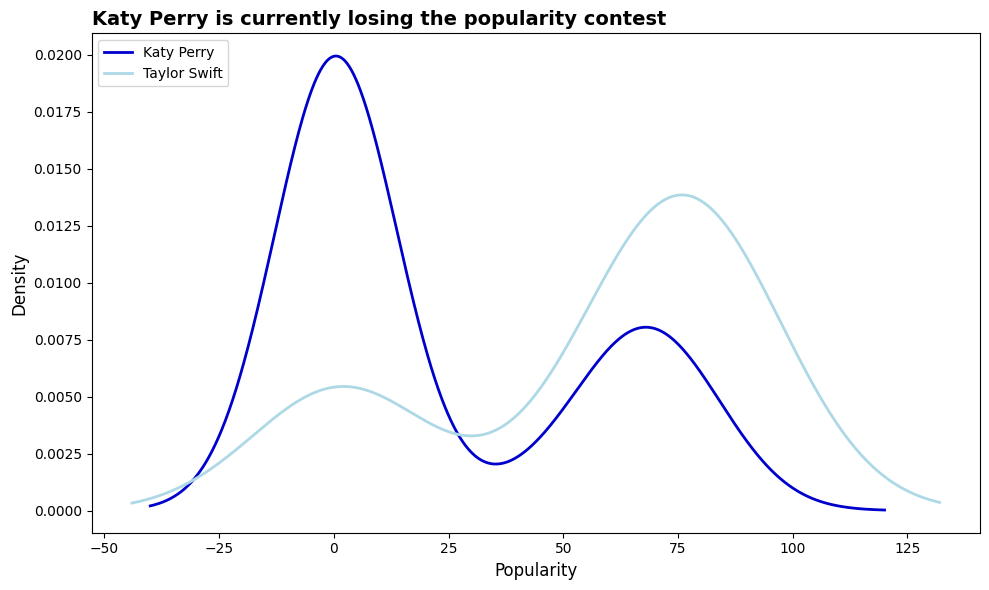

In [29]:
# Plot the distribution of popularity for both data frames
plt.figure(figsize=(10, 6))

# Plot for Katy Perry
data[data.faceoff == 'Katy Perry']['popularity'].plot(kind='density', label='Katy Perry', color='mediumblue', linewidth=2)

# Plot for Taylor Swift
data[data.faceoff == 'Taylor Swift']['popularity'].plot(kind='density', label='Taylor Swift', color='lightblue', linewidth=2)

# Add title and labels with improved clarity
plt.title('Katy Perry is currently losing the popularity contest', fontsize=14, fontweight='bold', loc='left')
plt.xlabel('Popularity', fontsize=12)
plt.ylabel('Density', fontsize=12)



# Add legend with better placement
plt.legend( fontsize=10, title_fontsize=12, loc='upper left')

# Show the plot
plt.tight_layout()
plt.show()

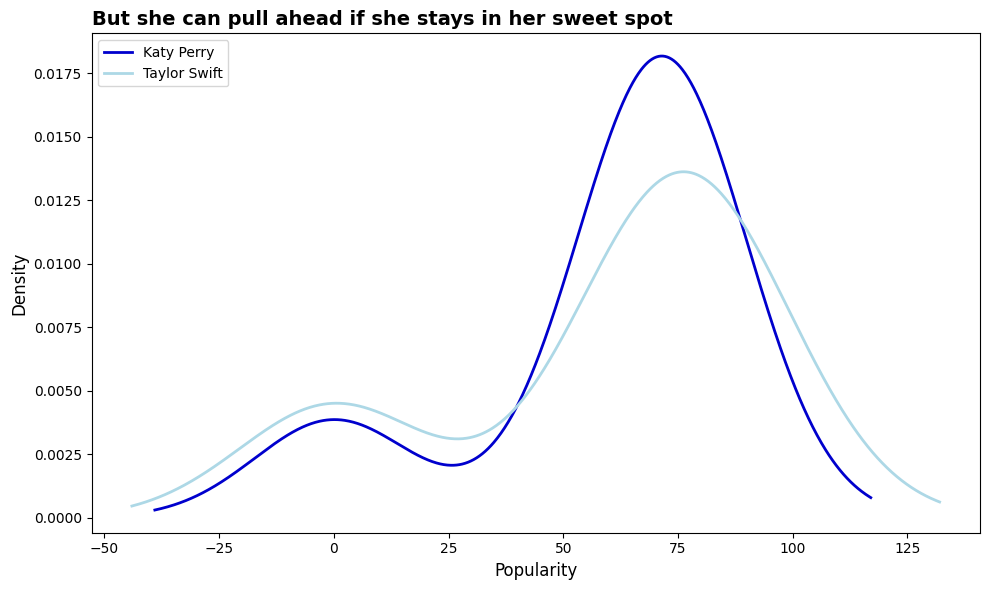

In [30]:
# Plot the distribution of popularity for both data frames
plt.figure(figsize=(10, 6))

# Plot for Katy Perry
katy_data['popularity'].plot(kind='density', label='Katy Perry', color='mediumblue', linewidth=2)

# Plot for Taylor Swift
taylor_data['popularity'].plot(kind='density', label='Taylor Swift', color='lightblue', linewidth=2)

# Add title and labels with improved clarity
plt.title('But she can pull ahead if she stays in her sweet spot', fontsize=14, fontweight='bold', loc='left')
plt.xlabel('Popularity', fontsize=12)
plt.ylabel('Density', fontsize=12)



# Add legend with better placement
plt.legend( fontsize=10, title_fontsize=12, loc='upper left')

# Show the plot
plt.tight_layout()
plt.show()